In [1]:
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from keras.preprocessing.image import load_img #import image need this
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Activation, Dropout, Flatten, Dense,Input
from keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.applications import VGG16
from keras.applications import VGG19
from keras.applications import ResNet50
from keras.applications import MobileNetV2
from keras.callbacks import ModelCheckpoint
from keras.utils.vis_utils import plot_model
from keras.models import Model
from keras import optimizers
import tensorflow as  tf
import keras.backend as K
import os
import random
import scipy
from sklearn.metrics import classification_report, confusion_matrix,roc_curve,roc_auc_score,auc
from keras.layers.advanced_activations import LeakyReLU

Using TensorFlow backend.


In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [3]:
def history_plot(results,img_namge): 
    # list all data in history
    print(results.history.keys())
    # summarize history for accuracy
    plt.figure(1)
    plt.plot(results.history['acc'])
    plt.plot(results.history['val_acc'])
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.savefig(('Accuracy_'+img_namge),dpi=300)
    plt.show()

    # summarize history for loss
    plt.figure(2)
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot(np.argmin(results.history["val_loss"]), 
             np.min(results.history["val_loss"]), 
             marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend();
    plt.savefig(('Loss_'+img_namge),dpi=300)
    plt.show()

In [ ]:
#flow_from_directory目錄需要分3類
train_image = './pneu_dataset/train'
valid_image = './pneu_dataset/validation'
test_image = './pneu_dataset/test'

In [ ]:
# Setting the default value
# dimensions of our images.
img_width, img_height = 224 , 224
batch_size = 32
epochs = 1000
seed = 42
class_mode = 'categorical'
date = '2019-06-20_VGG16'

In [ ]:
#ImageDataGenerator
# used to rescale the pixel values from [0, 255] to [0, 1] interval
datagen = ImageDataGenerator(rescale=1./255,
                             rotation_range = 180)  #圖片隨機轉動
#                              width_shift_range = 0.2, #圖片水平偏移
#                              height_shift_range = 0.2, #圖片垂直偏移
#                              zoom_range = 0.3)

# automagically retrieve images and their classes for train and validation sets
train_generator = datagen.flow_from_directory(
       train_image,
        target_size = (img_width, img_height),
        batch_size = batch_size,
        class_mode = class_mode,
        seed = seed)

validation_generator = datagen.flow_from_directory(
        valid_image,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode = class_mode,
        shuffle = False ,
        seed = seed)

# test_generator = datagen.flow_from_directory(
#         test_image,
#         target_size = (img_width, img_height),
#         batch_size = 1,
#         class_mode = None,
#         shuffle = False,
#         seed = seed
#         )

In [ ]:
# ## Model way transfer learning
# initial_model =VGG16(include_top=False,weights='imagenet')
# input = Input(shape=(128,128,3),name = 'image_input')
# output_vgg16_conv = initial_model(input)

# x = Flatten()(output_vgg16_conv)
# x = Dense(4096, activation='relu', name='fc1')(x)
# x = Dense(4096, activation='relu', name='fc2')(x)
# x = Dense(3, activation='softmax', name='predictions')(x)

# model = Model(input= input ,output = x)

# Transfer learning
# model = Sequential()
# for layer in VGG16().layers:
#     model.add(layer)
# model.layers.pop()
# model.add(Dense(3, activation='softmax'))

In [ ]:
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from keras.optimizers import SGD
def VGG_16(weights_path=None):
    model = Sequential()
    model.add(ZeroPadding2D((1,1),input_shape=(224,224,3)))
    model.add(Convolution2D(64, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(64, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(128, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(256, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(ZeroPadding2D((1,1)))
    model.add(Convolution2D(512, 3, 3, activation='relu'))
    model.add(MaxPooling2D((2,2), strides=(2,2)))

    model.add(Flatten())
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(4096, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(3, activation='softmax'))

    if weights_path:
        model.load_weights(weights_path)

    return model

In [ ]:
model = VGG_16()
sgd = SGD(lr=0.1, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(optimizer=sgd, loss='categorical_crossentropy',metrics=['accuracy'])
# model.compile(loss='categorical_crossentropy',
#               optimizer='Adagrad',
#               metrics=['accuracy'])

In [ ]:
model.summary()

In [ ]:
# 設定checkpoint & callbacks
from keras.callbacks import EarlyStopping
from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import ModelCheckpoint
def callbacks(name):
    save_dir = "checkpoint"
    #     tl.files.exists_or_mkdir(save_dir)
    path=save_dir+'/model_check_'+name+'.h5'
    callbacks = [
        EarlyStopping(patience=15, verbose=1),
        ReduceLROnPlateau(factor=0.1, patience=10, min_lr=0.000001, verbose=1),
        ModelCheckpoint(path, verbose=1, save_best_only=True, save_weights_only=False)
#         ModelCheckpoint(path,monitor='val_acc', verbose=1,
#                         save_best_only=True, save_weights_only=False)
    ]
    return callbacks

In [ ]:
num_of_train_samples  = train_generator.classes.shape[0]
num_of_test_samples = validation_generator.classes.shape[0]

In [ ]:
history = model.fit_generator(
        train_generator,
        steps_per_epoch= num_of_train_samples//batch_size,
        validation_data=validation_generator,
        validation_steps= num_of_test_samples//batch_size,
        epochs = epochs,
        callbacks=callbacks(date+'_fit'))

In [ ]:
history_plot(history,'2019-6-22_vgg16')

In [ ]:
# Load CheckPoint
# from keras.models import load_model
# model= load_model('./checkpoint/model_check_2019-03-14_1_fit.h5')

In [ ]:
# evaluate the model
model.evaluate_generator(generator=validation_generator,
#                          steps=validation_generator.classes.shape[0]//32 +1,
                         steps=validation_generator.classes.shape[0],
                         verbose=1)

In [ ]:

# predict the output
Y_pred = model.predict_generator(validation_generator,
                                 steps=num_of_test_samples//32 +1,
                                 verbose=1)

In [ ]:
## Use auc to show the performance
# auc = roc_auc_score(validation_generator.classes,Y_pred)
# print("AUC: {}".format(auc))
# fpr, tpr, thresholds = roc_curve(validation_generator.classes, Y_pred)

In [ ]:
## Plot ROC curve
# plt.figure(3)
# plt.plot([0, 1], [0, 1], 'k--')
# plt.plot(fpr,tpr,label='AUC = %0.2f' % auc)
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('ROC Curve')
# # plt.show()
# plt.savefig("roc_curve.png",dpi=300)

In [4]:
# Load CheckPoint
from keras.models import load_model 
base_model= load_model('./checkpoint/model_check_2019-06-22_VGG16_final_fit.h5')

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [5]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_formats = {'png', 'retina'}
plt.rcParams['figure.figsize'] = 8,8

from scipy.ndimage.interpolation import zoom
from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
from tensorflow.python.framework import ops
import keras.backend as K
import tensorflow as tf
import numpy as np
import keras
import cv2
import os
import gradcamutils

In [14]:
def build_model():
    """Function returning keras model instance.
    
    Model can be
     - Trained here
     - Loaded with load_model
     - Loaded from keras.applications
    """
    # load model
    from keras.models import load_model 
    base_model= load_model('./checkpoint/model_check_2019-06-22_VGG16_final_fit.h5')
#     base_model = VGG_16()
#     sgd = SGD(lr=0.1, decay=1e-6, momentum=0.9, nesterov=True)
#     base_model.compile(optimizer=sgd, loss='categorical_crossentropy',metrics=['accuracy'])
    return base_model

H, W = 224, 224 # Input shape, defined by the model (model.input_shape)

In [15]:
def load_image(path, preprocess=True):
    """Load and preprocess image."""
    x = image.load_img(path, target_size=(H, W))
    if preprocess:
        x = image.img_to_array(x)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
    return x


def deprocess_image(x):
    """Same normalization as in:
    https://github.com/fchollet/keras/blob/master/examples/conv_filter_visualization.py
    """
    x = x.copy()
    if np.ndim(x) > 3:
        x = np.squeeze(x)
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    if K.image_dim_ordering() == 'th':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x


def normalize(x):
    """Utility function to normalize a tensor by its L2 norm"""
    return (x + 1e-10) / (K.sqrt(K.mean(K.square(x))) + 1e-10)

In [16]:
def build_guided_model():
    """Function returning modified model.
    
    Changes gradient function for all ReLu activations
    according to Guided Backpropagation.
    """
    if "GuidedBackProp" not in ops._gradient_registry._registry:
        @ops.RegisterGradient("GuidedBackProp")
        def _GuidedBackProp(op, grad):
            dtype = op.inputs[0].dtype
            return grad * tf.cast(grad > 0., dtype) * \
                   tf.cast(op.inputs[0] > 0., dtype)

    g = tf.get_default_graph()
    with g.gradient_override_map({'Relu': 'GuidedBackProp'}):
        new_model = build_model()
    return new_model


def guided_backprop(input_model, images, layer_name):
    """Guided Backpropagation method for visualizing input saliency."""
    input_imgs = input_model.input
    layer_output = input_model.get_layer(layer_name).output
    grads = K.gradients(layer_output, input_imgs)[0]
    backprop_fn = K.function([input_imgs, K.learning_phase()], [grads])
    grads_val = backprop_fn([images, 0])[0]
    return grads_val

In [17]:
def grad_cam(input_model, image, cls, layer_name):
    """GradCAM method for visualizing input saliency."""
    y_c = input_model.output[0, cls]
    conv_output = input_model.get_layer(layer_name).output
    grads = K.gradients(y_c, conv_output)[0]
    # Normalize if necessary
    # grads = normalize(grads)
    gradient_function = K.function([input_model.input], [conv_output, grads])

    output, grads_val = gradient_function([image])
    output, grads_val = output[0, :], grads_val[0, :, :, :]

    weights = np.mean(grads_val, axis=(0, 1))
    cam = np.dot(output, weights)

    # Process CAM
    cam = cv2.resize(cam, (W, H), cv2.INTER_LINEAR)
    cam = np.maximum(cam, 0)
    cam = cam / cam.max()
    return cam

def grad_cam_batch(input_model, images, classes, layer_name):
    """GradCAM method for visualizing input saliency.
    Same as grad_cam but processes multiple images in one run."""
    loss = tf.gather_nd(input_model.output, np.dstack([range(images.shape[0]), classes])[0])
    layer_output = input_model.get_layer(layer_name).output
    grads = K.gradients(loss, layer_output)[0]
    gradient_fn = K.function([input_model.input, K.learning_phase()], [layer_output, grads])

    conv_output, grads_val = gradient_fn([images, 0])    
    weights = np.mean(grads_val, axis=(1, 2))
    cams = np.einsum('ijkl,il->ijk', conv_output, weights)
    
    # Process CAMs
    new_cams = np.empty((images.shape[0], H, W))
    for i in range(new_cams.shape[0]):
        cam_i = cams[i] - cams[i].mean()
        cam_i = (cam_i + 1e-10) / (np.linalg.norm(cam_i, 2) + 1e-10)
        new_cams[i] = cv2.resize(cam_i, (W, H), cv2.INTER_LINEAR)
        new_cams[i] = np.maximum(new_cams[i], 0)
        new_cams[i] = new_cams[i] / new_cams[i].max()
    
    return new_cams

In [18]:
def decode_predictions_cust(preds, class_custom, top=3):
    results = []

    for pred in preds:
        top_indices = pred.argsort()[-top:][::-1]
        result = [tuple(class_custom[i][0])+(class_custom[i][1],) + (pred[i]*100,)\
                  for i in top_indices] 
        results.append(result)
    return results

In [19]:
class_name=[('0','Lung Opacity'),('1','Normal'),('2','Not Normal')]
label = [] # label Lung Opacity, Normal, Not Normal
# path of img 
valid_lung_op_path='./pneu_dataset/validation/Lung Opacity/'
valid_normal_path='./pneu_dataset/validation/Normal/'
valid_not_normal_path='./pneu_dataset/validation/Not Normal/'
paths = [valid_lung_op_path,valid_normal_path,valid_not_normal_path]
# list of each img
valid_path = []
# dir 
for path in paths:
    for file in  os.listdir(path):
        if path == './pneu_dataset/validation/Lung Opacity/':
            valid_path.append(path+file)
            label.append('Lung Opacity')
        elif path == './pneu_dataset/validation/Normal/':
            valid_path.append(path+file)
            label.append('Normal')
        elif path == './pneu_dataset/validation/Not Normal/':
            valid_path.append(path+file)
            label.append('Not Normal')
        else :
            label.append('None')

In [20]:
base_model = build_model()
guided_model = build_guided_model()

Model prediction:
	Normal         	(1)	with probability 99.830
	Not Normal     	(2)	with probability 0.170
	Lung Opacity   	(0)	with probability 0.000
Explanation for 'Normal'
Model prediction:
	Not Normal     	(2)	with probability 99.975
	Lung Opacity   	(0)	with probability 0.025
	Normal         	(1)	with probability 0.000
Explanation for 'Not Normal'
Model prediction:
	Not Normal     	(2)	with probability 99.869
	Lung Opacity   	(0)	with probability 0.131
	Normal         	(1)	with probability 0.000
Explanation for 'Not Normal'
Model prediction:
	Normal         	(1)	with probability 65.998
	Not Normal     	(2)	with probability 33.989
	Lung Opacity   	(0)	with probability 0.014
Explanation for 'Normal'
Model prediction:
	Not Normal     	(2)	with probability 99.999
	Lung Opacity   	(0)	with probability 0.001
	Normal         	(1)	with probability 0.001
Explanation for 'Not Normal'
Model prediction:
	Not Normal     	(2)	with probability 95.560
	Normal         	(1)	with probability 4.252


Model prediction:
	Not Normal     	(2)	with probability 70.523
	Normal         	(1)	with probability 29.402
	Lung Opacity   	(0)	with probability 0.074
Explanation for 'Not Normal'
Model prediction:
	Normal         	(1)	with probability 100.000
	Not Normal     	(2)	with probability 0.000
	Lung Opacity   	(0)	with probability 0.000
Explanation for 'Normal'
Model prediction:
	Normal         	(1)	with probability 100.000
	Not Normal     	(2)	with probability 0.000
	Lung Opacity   	(0)	with probability 0.000
Explanation for 'Normal'
Model prediction:
	Not Normal     	(2)	with probability 100.000
	Normal         	(1)	with probability 0.000
	Lung Opacity   	(0)	with probability 0.000
Explanation for 'Not Normal'
Model prediction:
	Normal         	(1)	with probability 100.000
	Not Normal     	(2)	with probability 0.000
	Lung Opacity   	(0)	with probability 0.000
Explanation for 'Normal'
Model prediction:
	Not Normal     	(2)	with probability 97.569
	Lung Opacity   	(0)	with probability 2.431


KeyboardInterrupt: 

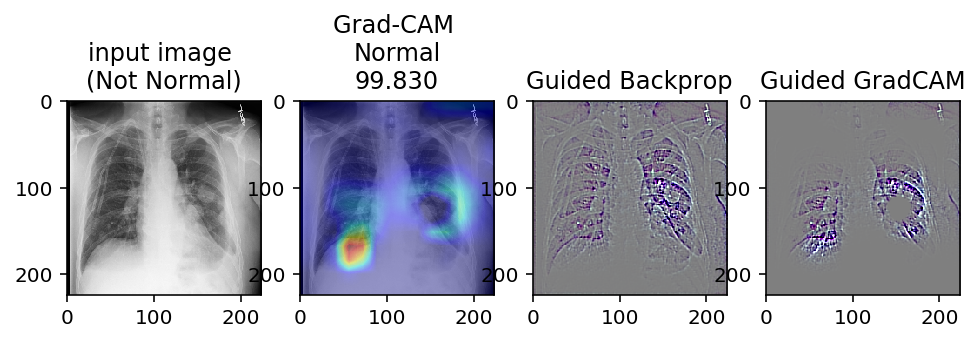

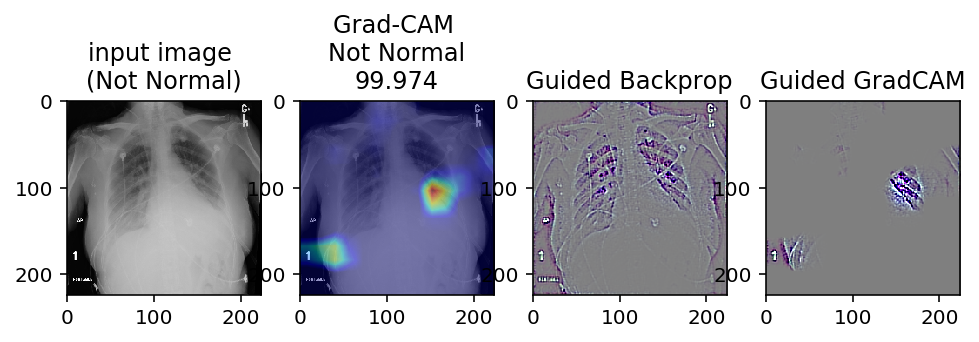

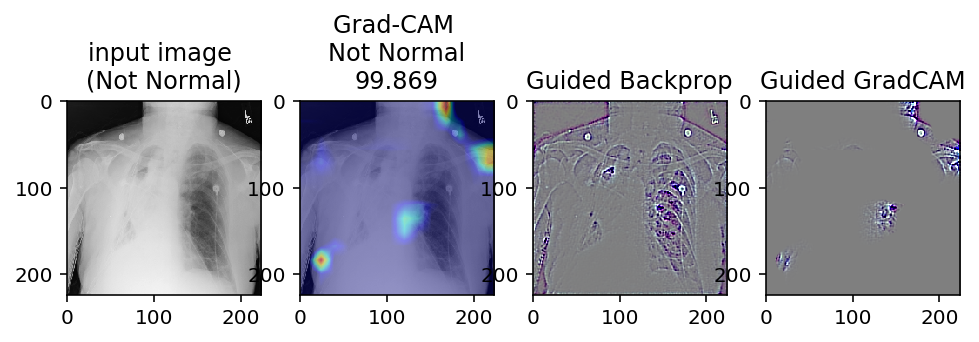

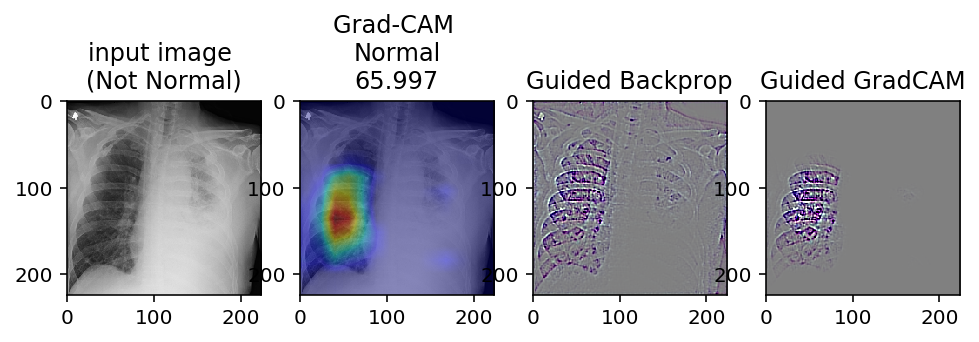

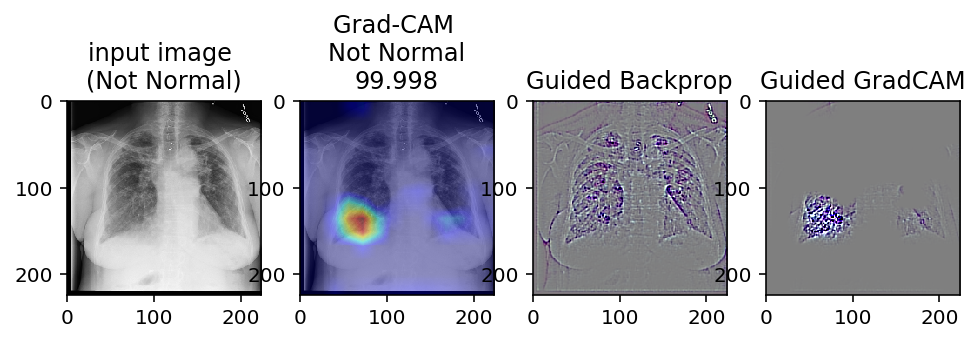

...

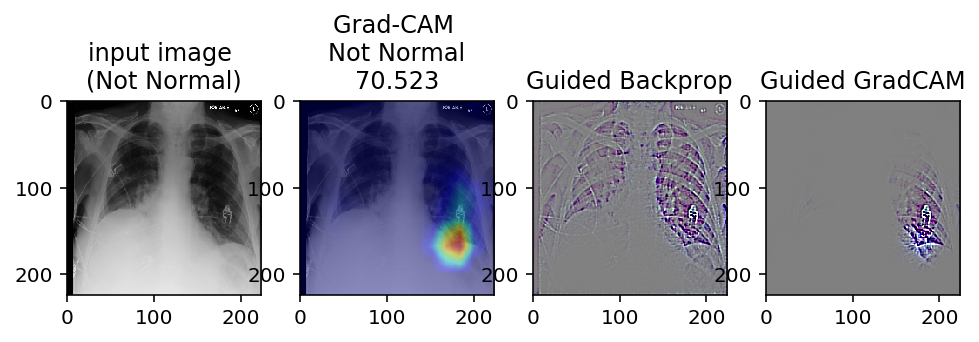

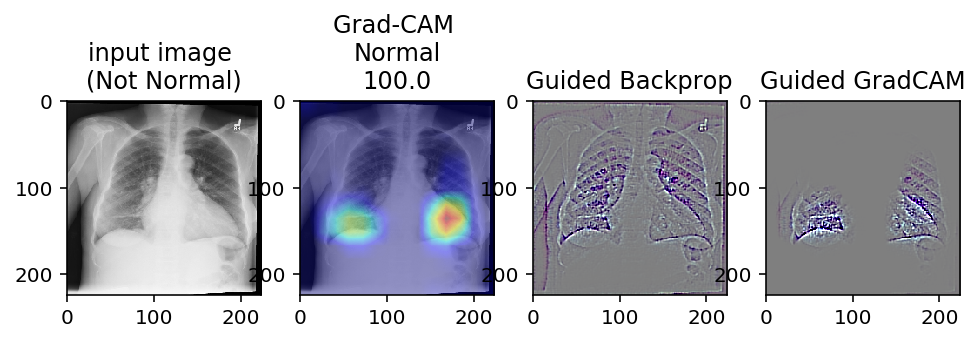

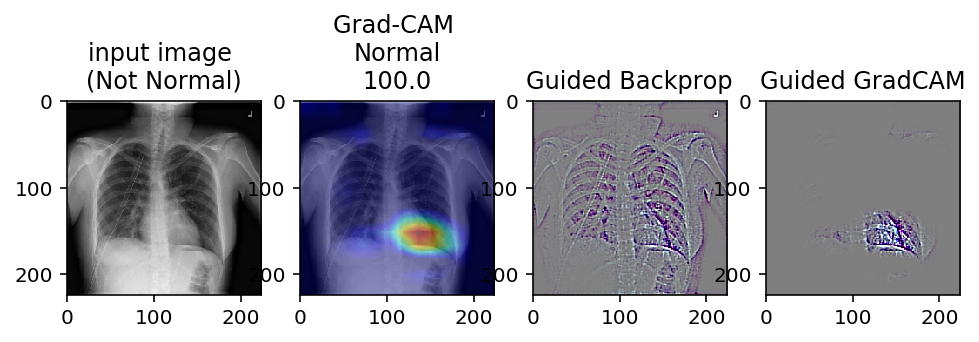

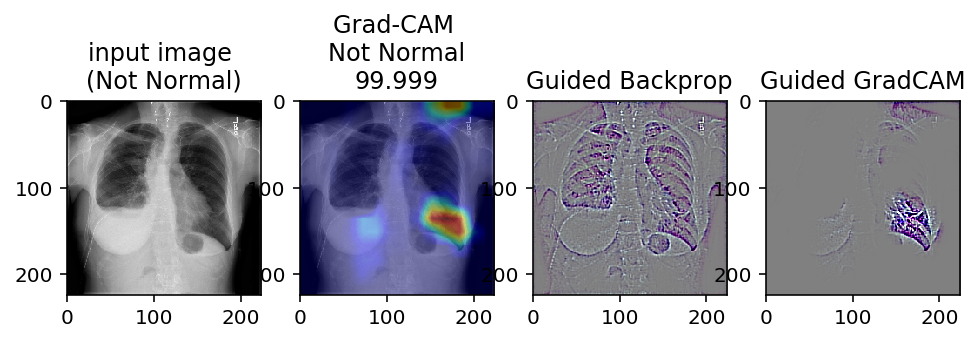

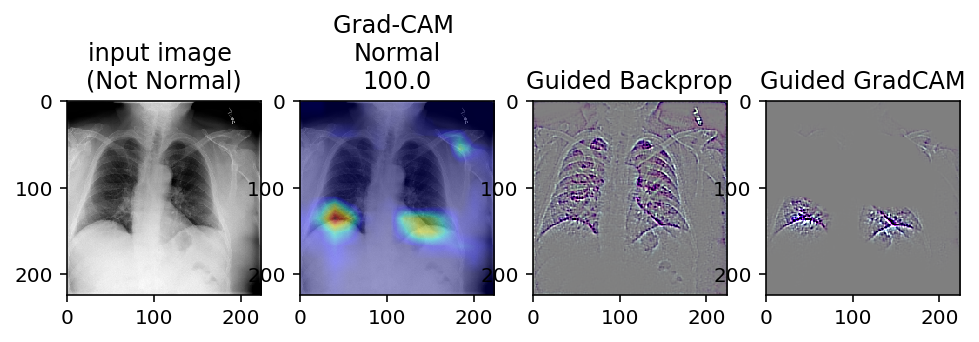

In [26]:
## Configuration
save_path='./gram_cam_image_only/VGG16/'
cls=-1 
index = 0
## start Run
for path in valid_path :
    index+=1
    if index <=5000 : # Change other data type
        pass 
    else : 
        orig_img = np.array(load_img(path,target_size=(224,224)),dtype=np.uint8)

        preprocessed_input = load_image(path)
        predictions = base_model.predict(preprocessed_input)
        top_n = 3
        top = decode_predictions_cust(predictions,class_name,top=top_n)[0]
        classes = np.argsort(predictions[0])[-top_n:][::-1]
        print('Model prediction:')
        for c, p in zip(classes, top):
            print('\t{:15s}\t({})\twith probability {:.3f}'.format(p[1], c, p[2]))
        if cls == -1:
            cls = np.argmax(predictions)
    #     class_name = decode_predictions(np.eye(1, top_n, cls))[0][0][1]
        print("Explanation for '{}'".format(top[0][1]))

        gradcam = grad_cam(base_model, preprocessed_input, cls, 'conv2d_13')
        gb = guided_backprop(guided_model, preprocessed_input, 'conv2d_13')
        guided_gradcam = gb * gradcam[..., np.newaxis]

        plt.figure(figsize=(8, 8))
    #     fig, ax = plt.subplots(nrows=1,ncols=3)
        plt.subplot(141)
        plt.title("input image \n"+'('+str(label[index])+')')
        plt.imshow(orig_img)
        plt.subplot(142)
        plt.title("Grad-CAM \n"+str(top[0][1])+'\n'+str(top[0][2])[:6])
    #     plt.axis('off')
        plt.imshow(load_image(path, preprocess=False))
        plt.imshow(gradcam, cmap='jet', alpha=0.4)

        plt.subplot(143)
        plt.title('Guided Backprop')
    #     plt.axis('off')
        plt.imshow(np.flip(deprocess_image(gb[0]), -1))

        plt.subplot(144)
        plt.title('Guided GradCAM')
    #     plt.axis('off')
        plt.imshow(np.flip(deprocess_image(guided_gradcam[0]), -1))
        plt.savefig(save_path+'gradcam_only_'+str(index)+'.png',dpi=300)
    #     plt.show()
#     if index > 100:
#         break
        
#     jetcam = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
#     jetcam = (np.float32(jetcam) + load_image(path, preprocess=False)) / 2
#     cv2.imwrite(save_path+'gradcam'+str(index)+'.jpg', np.uint8(jetcam))
#     cv2.imwrite(save_path+'guided_backprop'+str(index)+'.jpg', deprocess_image(gb[0]))
#     cv2.imwrite(save_path+'guided_gradcam'+str(index)+'.jpg', deprocess_image(guided_gradcam[0]))  

In [ ]:
# def compute_saliency(model, guided_model, img_path,save_path=None,index=0 ,layer_name='block5_conv3', cls=-1, visualize=True, save=True):
#     """Compute saliency using all three approaches.
#         -layer_name: layer to compute gradients;
#         -cls: class number to localize (-1 for most probable class).
#     """
#     preprocessed_input = load_image(img_path)

#     predictions = model.predict(preprocessed_input)
#     top_n = 3
#     top = decode_predictions(predictions, top=top_n)[0]
#     classes = np.argsort(predictions[0])[-top_n:][::-1]
#     print('Model prediction:')
#     for c, p in zip(classes, top):
#         print('\t{:15s}\t({})\twith probability {:.3f}'.format(p[1], c, p[2]))
#     if cls == -1:
#         cls = np.argmax(predictions)
#     class_name = decode_predictions(np.eye(1, 1000, cls))[0][0][1]
#     print("Explanation for '{}'".format(class_name))
    
#     gradcam = grad_cam(model, preprocessed_input, cls, layer_name)
#     gb = guided_backprop(guided_model, preprocessed_input, layer_name)
#     guided_gradcam = gb * gradcam[..., np.newaxis]

#     if save:
#         jetcam = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
#         jetcam = (np.float32(jetcam) + load_image(img_path, preprocess=False)) / 2
#         cv2.imwrite(save_path+'gradcam'+str(index)+'.jpg', np.uint8(jetcam))
#         cv2.imwrite(save_path+'guided_backprop'+str(index)+'.jpg', deprocess_image(gb[0]))
#         cv2.imwrite(save_path+'guided_gradcam'+str(index)+'.jpg', deprocess_image(guided_gradcam[0]))
    
#     if visualize:
#         plt.figure(figsize=(15, 10))
#         plt.subplot(131)
#         plt.title('GradCAM')
#         plt.axis('off')
#         plt.imshow(load_image(img_path, preprocess=False))
#         plt.imshow(gradcam, cmap='jet', alpha=0.5)

#         plt.subplot(132)
#         plt.title('Guided Backprop')
#         plt.axis('off')
#         plt.imshow(np.flip(deprocess_image(gb[0]), -1))
        
#         plt.subplot(133)
#         plt.title('Guided GradCAM')
#         plt.axis('off')
#         plt.imshow(np.flip(deprocess_image(guided_gradcam[0]), -1))
#         plt.show()
        
#     return gradcam, gb, guided_gradcam